## You will be using this package for benchmarking on a set of test problems

Gradient-Free-Optimizers

https://github.com/SimonBlanke/Gradient-Free-Optimizers



In [1]:
#load benchmarks problems

import numpy as np

eqc = np.load('eqcS.npy',allow_pickle=True).item() 
class prb:   #this will be your black box function
    def __init__(self,prob,noisy_level):
        # function for generating data
        self.func=prob['func']
        # number of constraints
        self.n_con=prob['n_con']
        # noise level
        self.nl=noisy_level
        # constraints
        self.con=[]
        for i in range(self.n_con):
            self.con.append(prob['con'+str(i+1)])
    def datcol(self,x):
        try:
            # eval takes string type input and evaluates python code. Input can be
            #a mathematical function or a python function which will be called.
            y = eval(self.func)
        except:
            x = np.array([x])
            y = eval(self.func)
        return float(y)
    def constraint(self,x):
        # Appears to evaluate if the constraints are satisfied
        #returns 1 if all constraints are satisfied, else -1
        try:     
            m,n=np.shape(x)
        except:
            x = np.array([x])
            m,n=np.shape(x)
        y=np.empty((self.n_con))
        for i in range(self.n_con):
            y[i]=eval(self.con[i])     
        if y.all() == 1.:
            label = 1.
        else:
            label = -1.
        return label
    
bcp=np.load('bcp8.npy',allow_pickle=True).item()

class benchmark:
    def __init__(self,func,noisy_level):
        self.func = str(func)
        self.nl = noisy_level
    def datcol(self,x):
        try:
            y = eval(self.func)
        except:
            x = np.array([x])
            y = eval(self.func)
        return float(y)

### below are the plots for visualizing 2 variable examples

Dimensionality varies from 2-10

use the text files provided to you for categorizing based on dimensionality

You'll be generating performance curves to compare different algorithms, similar to the work in the paper that was sent to you recently by Dr. Boukouvala

/tmp/ipykernel_256235/2358343327.py:46: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
/tmp/ipykernel_256235/2358343327.py:47: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.
  ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
/tmp/ipykernel_256235/2358343327.py:48: MatplotlibDeprecationWarning: The w_zaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use zaxis instead.
  ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))


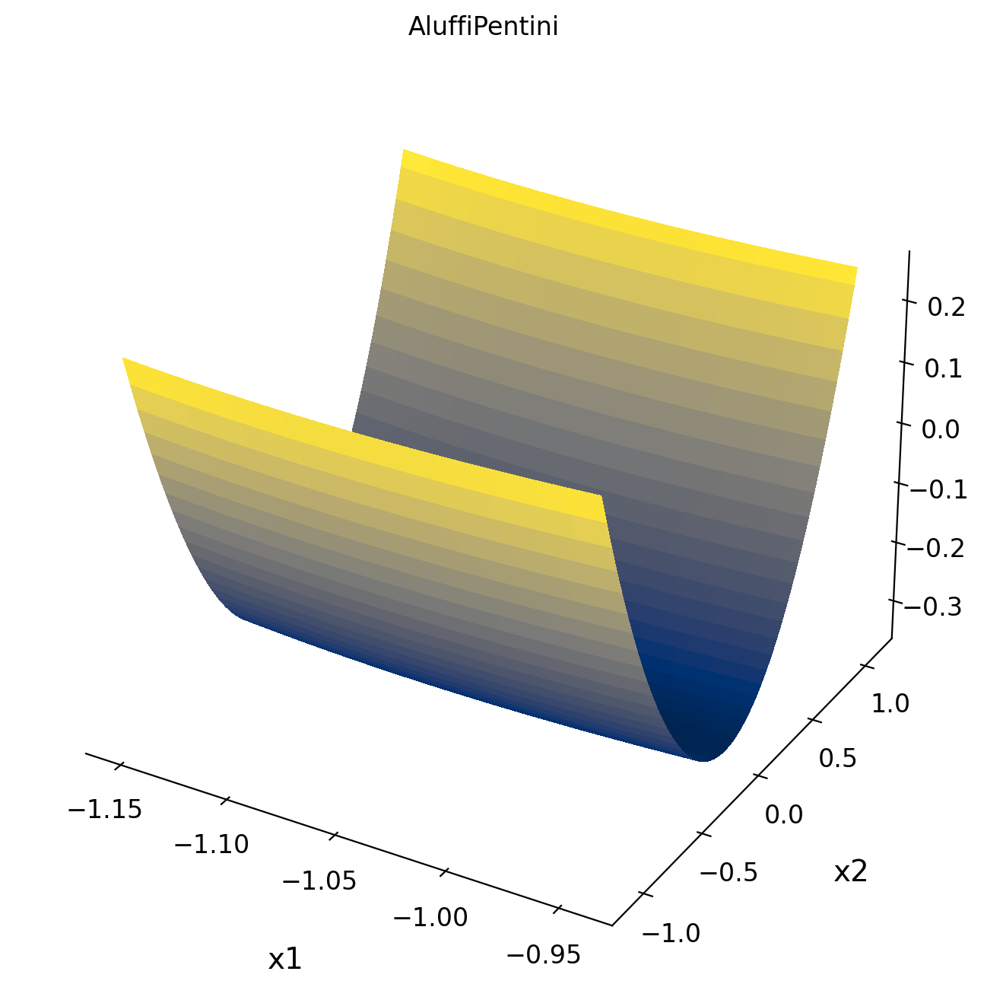

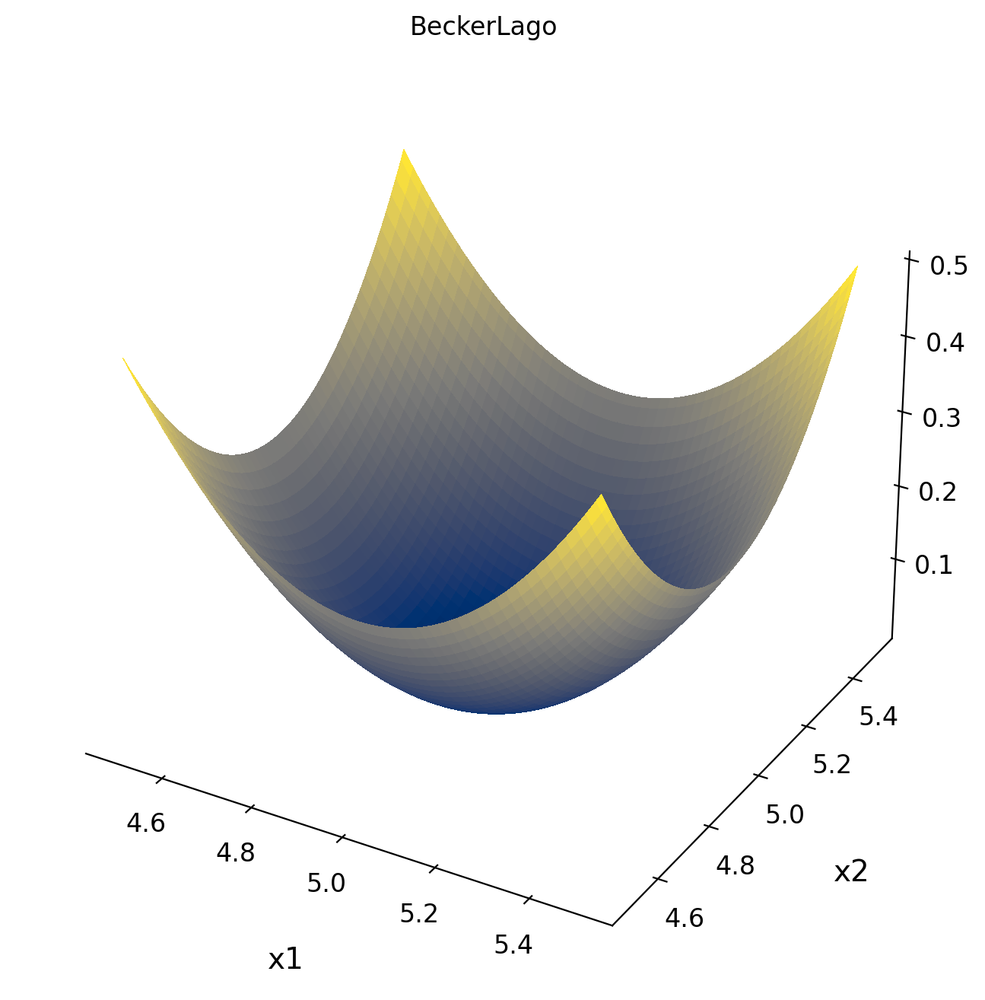

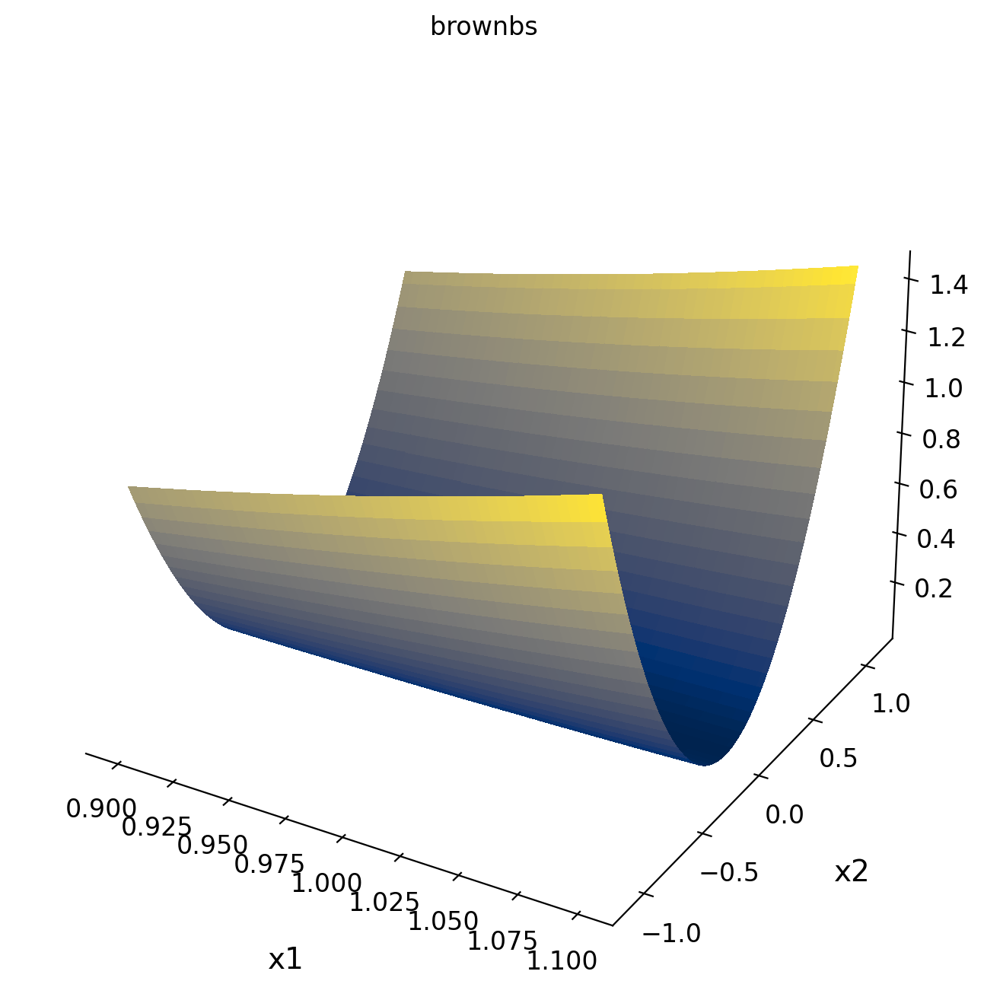

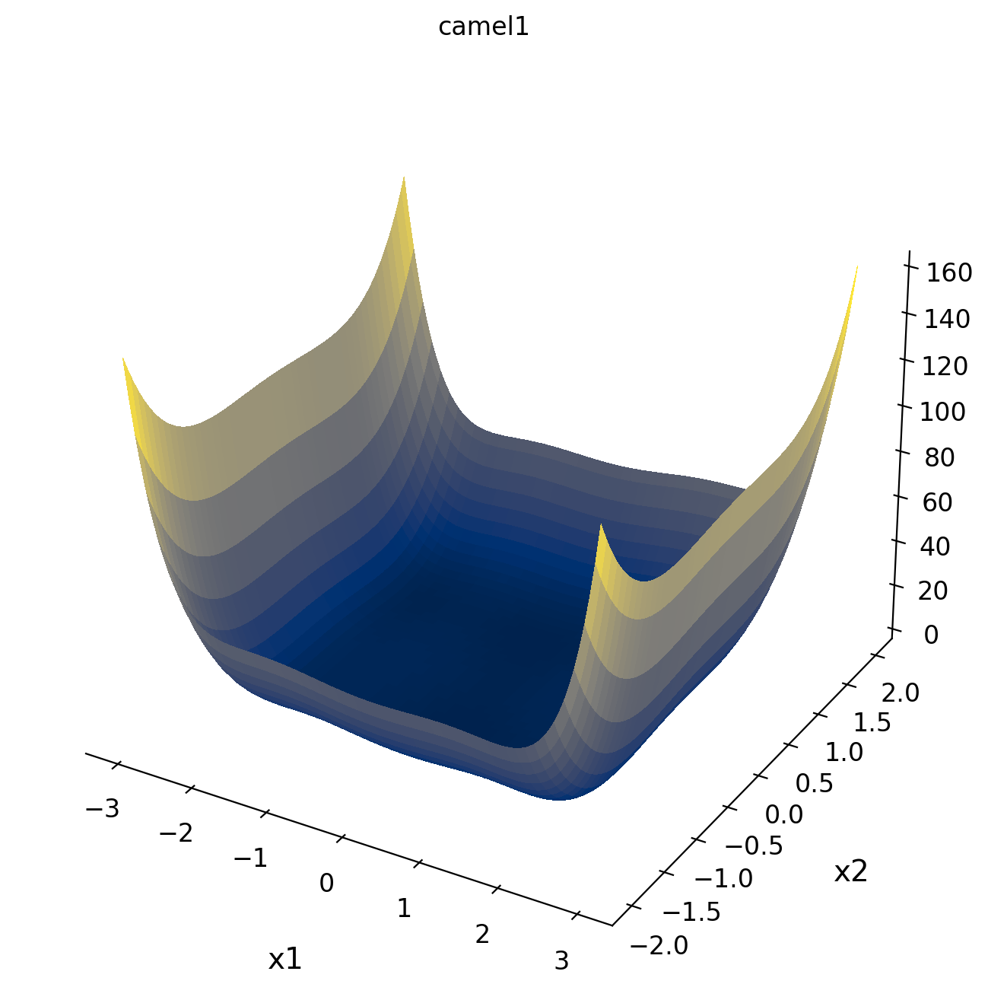

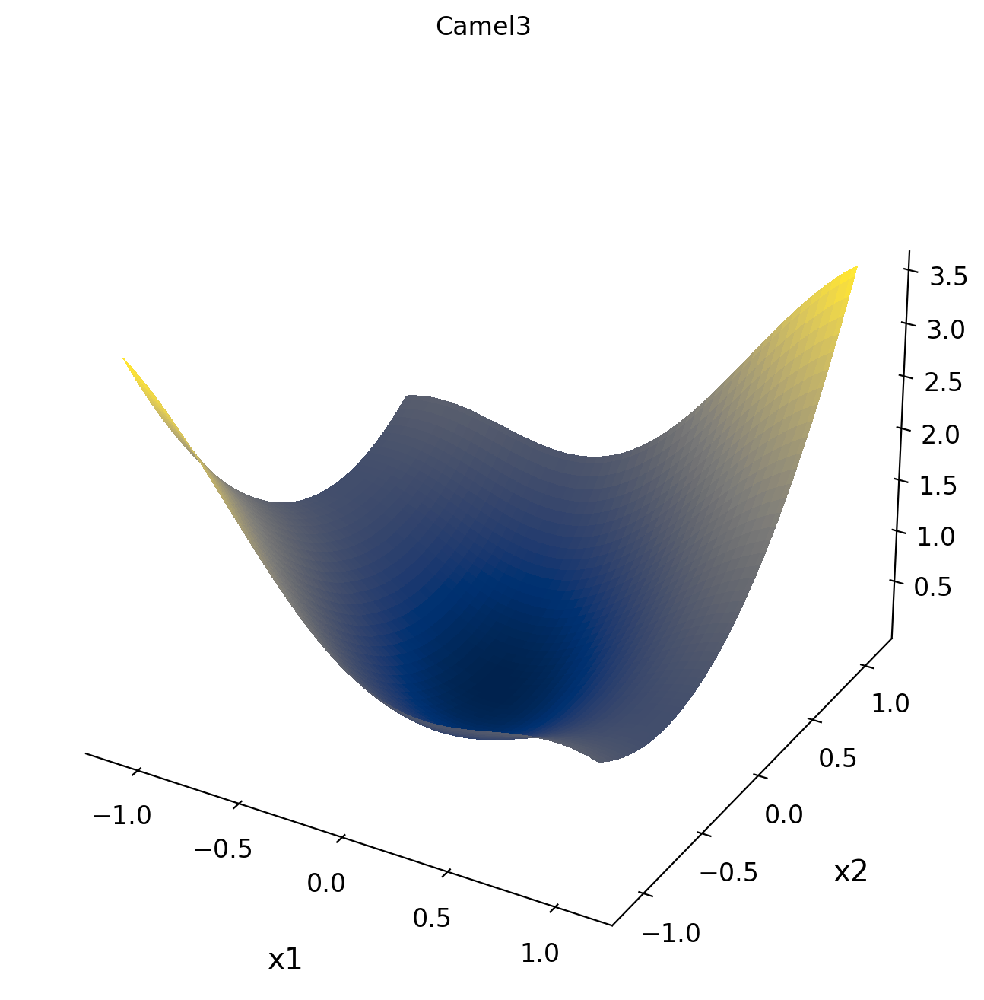

...

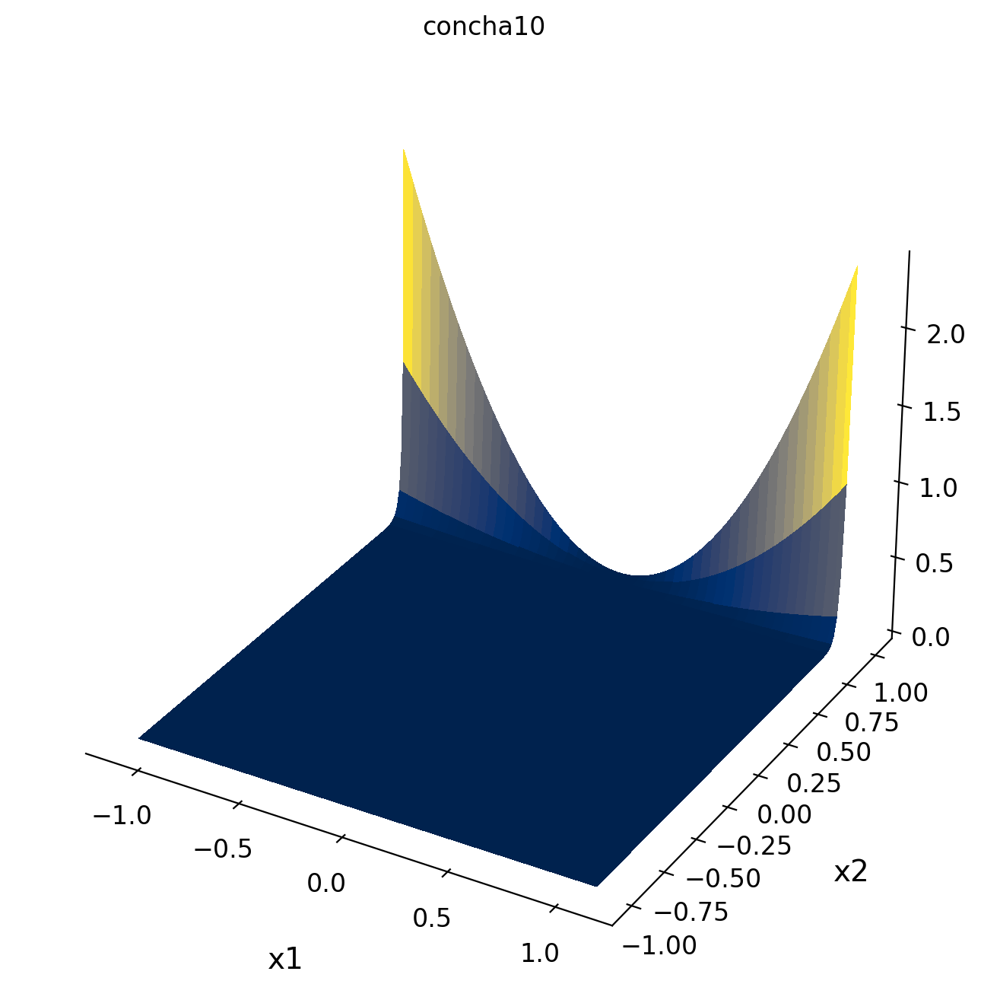

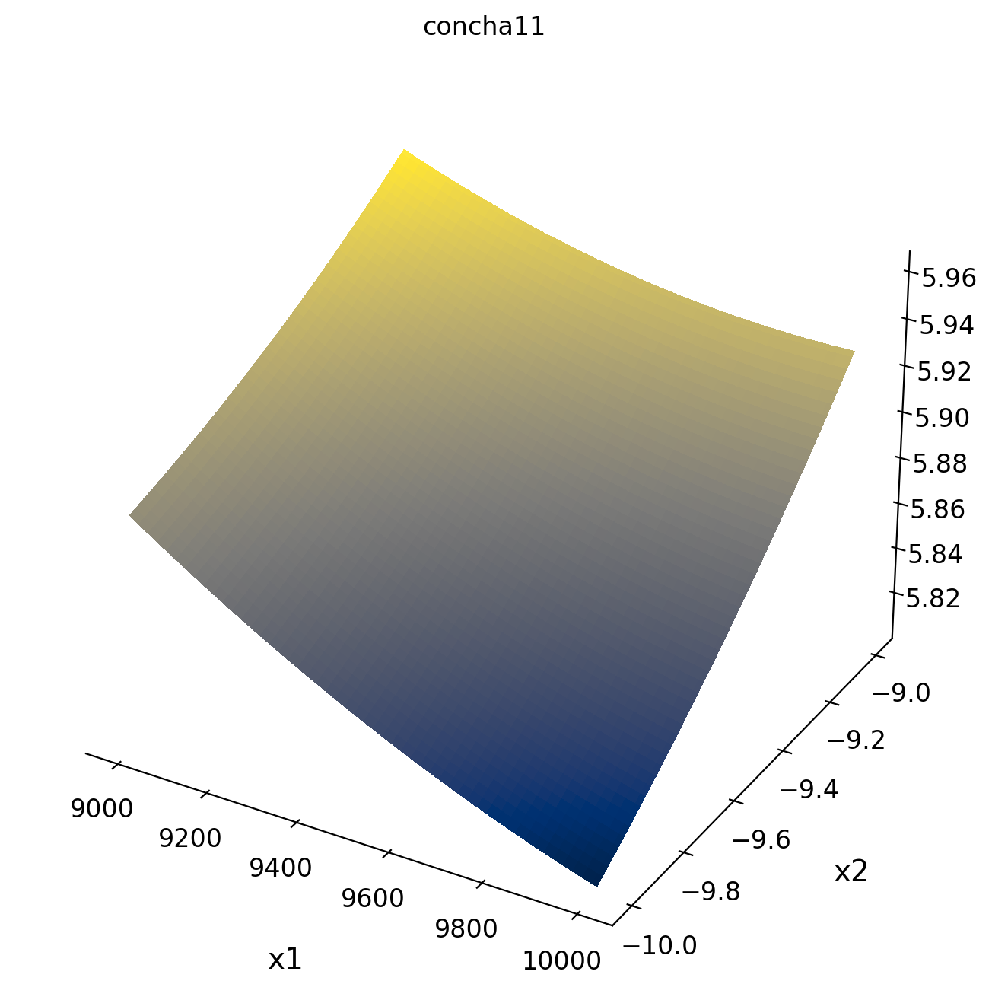

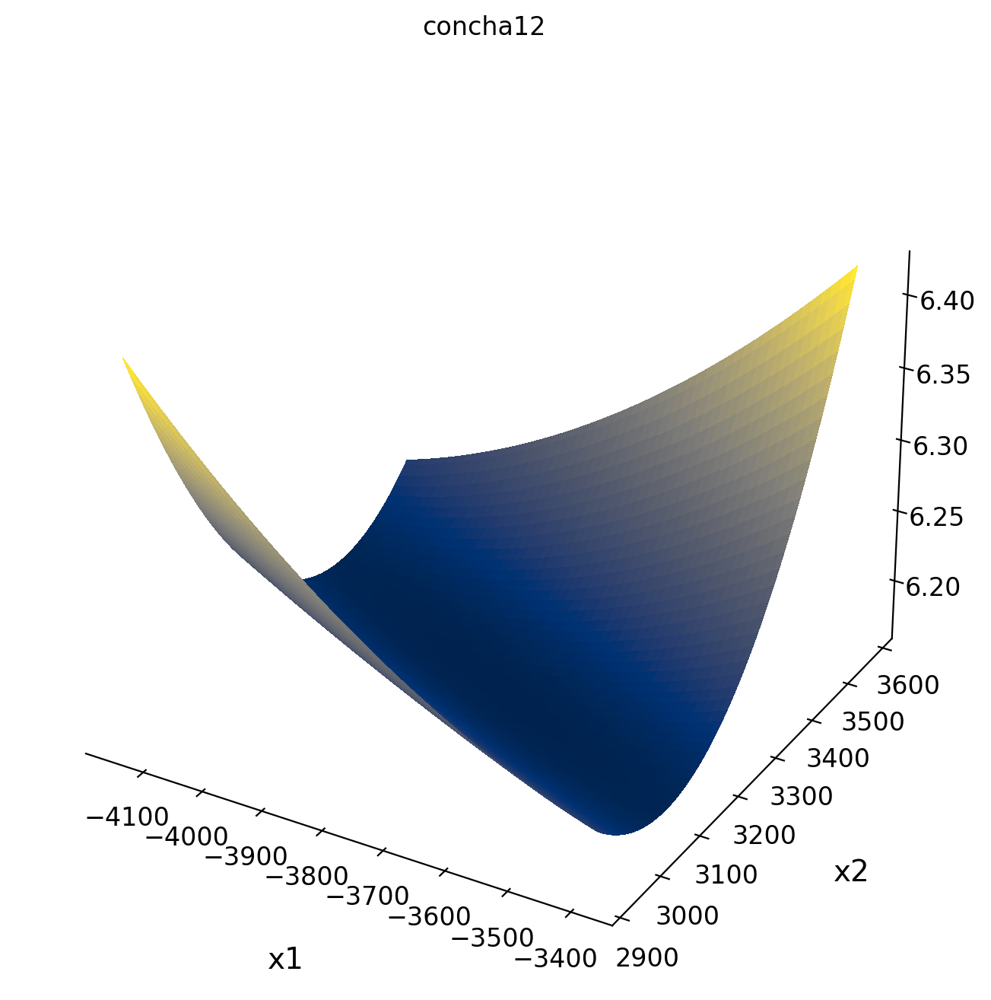

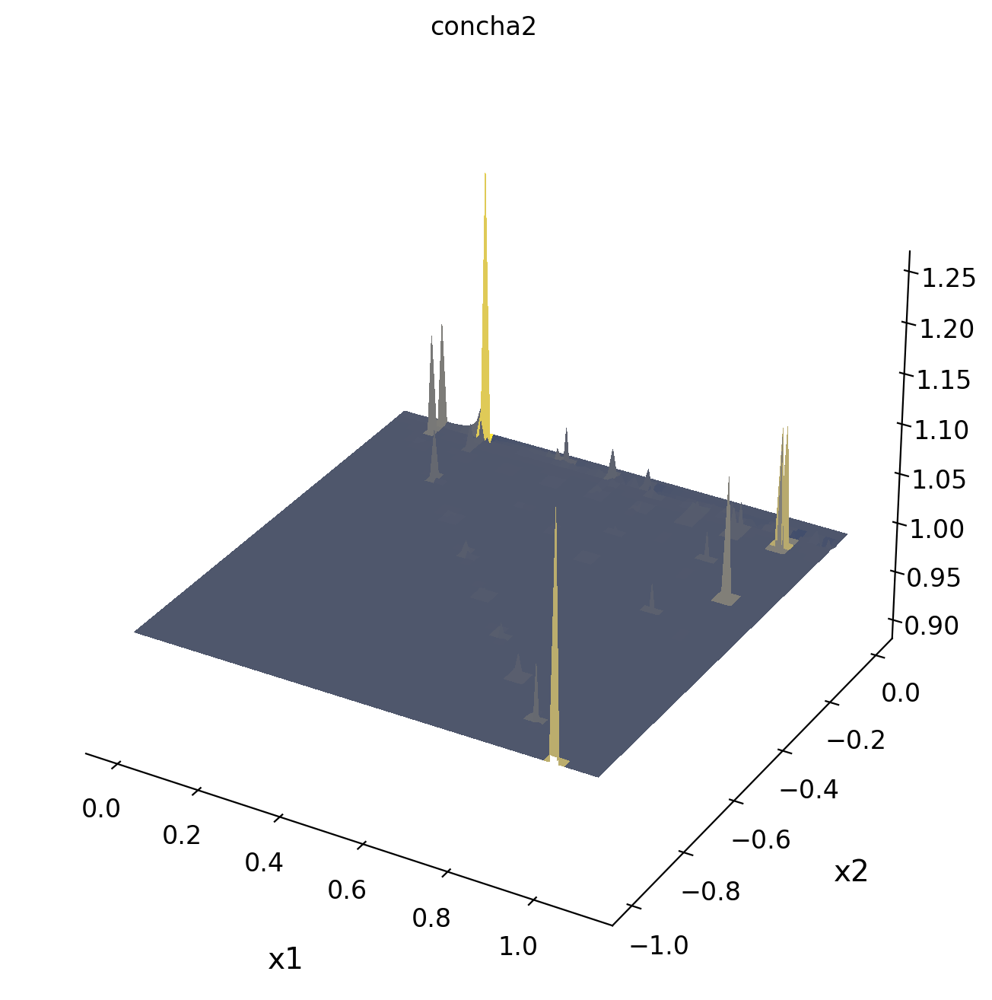

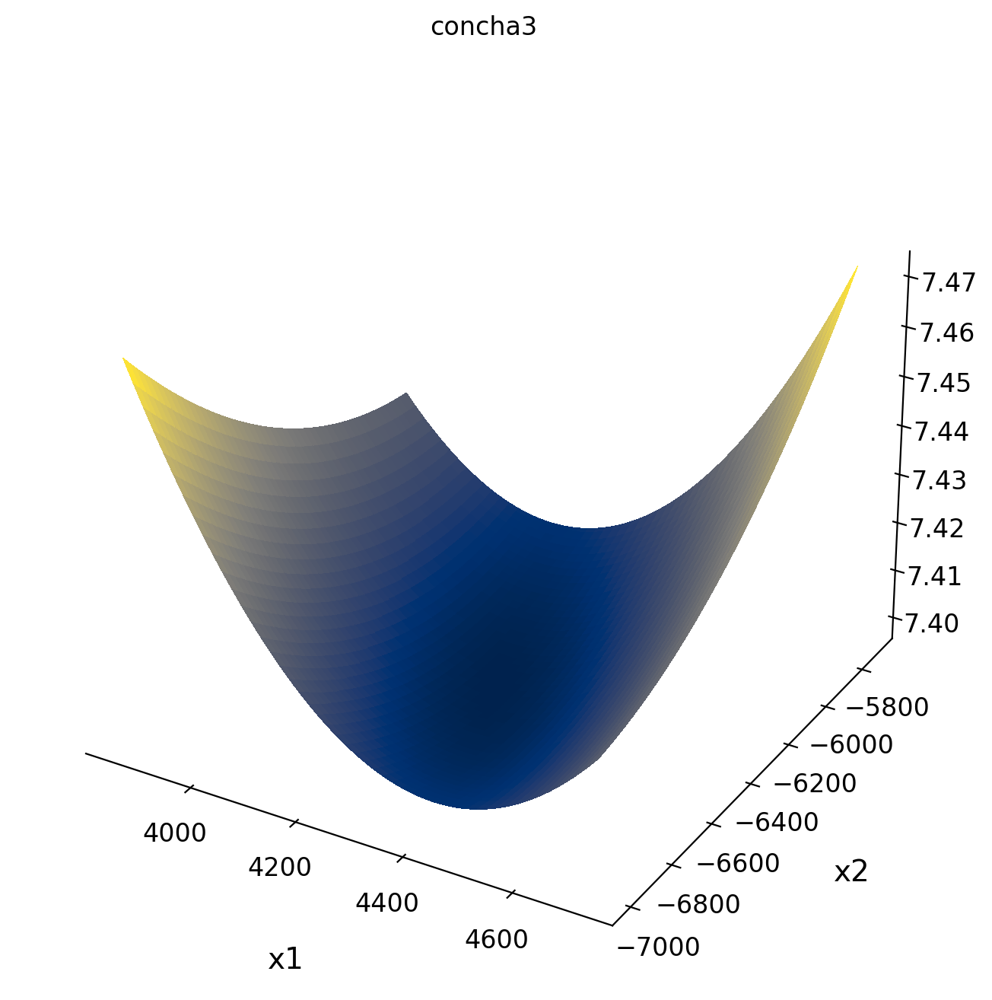

<string>:1: RuntimeWarning: divide by zero encountered in divide
/home/lucas/anaconda3/envs/gen_ml/lib/python3.9/site-packages/mpl_toolkits/mplot3d/proj3d.py:180: RuntimeWarning: invalid value encountered in divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


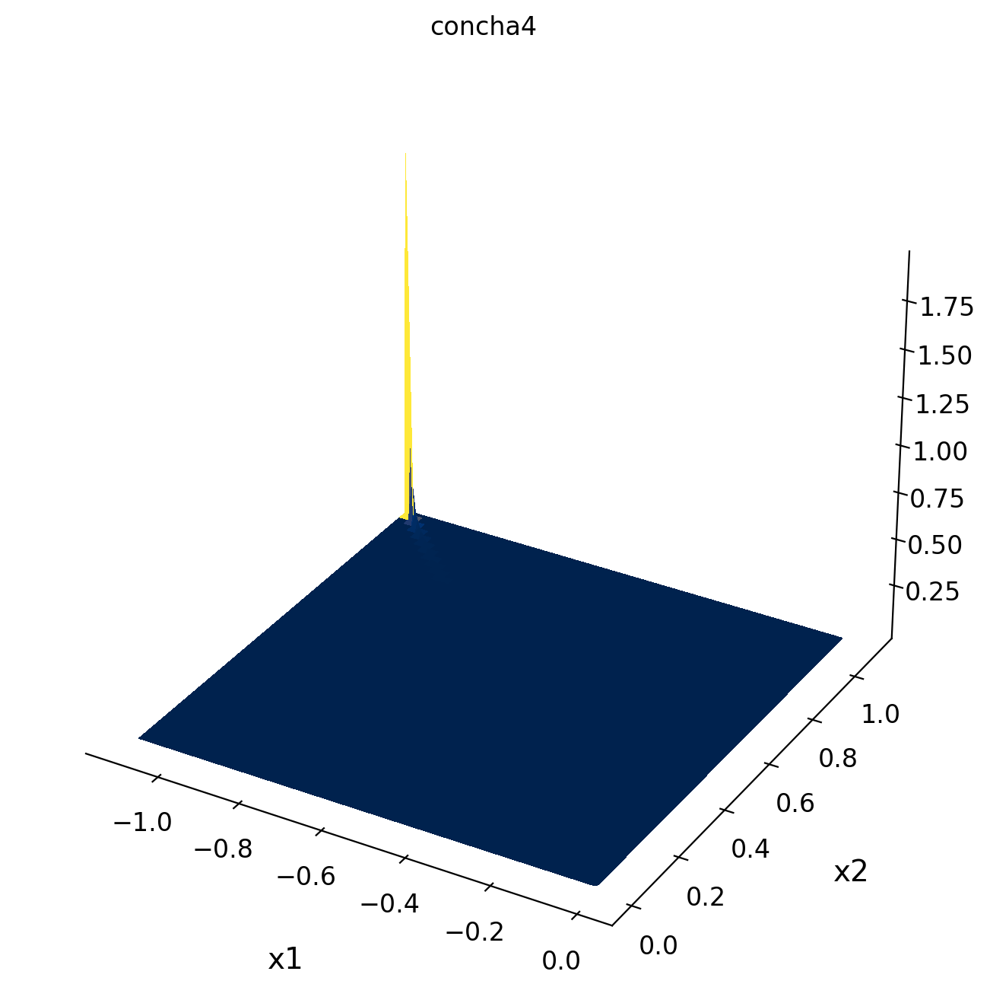

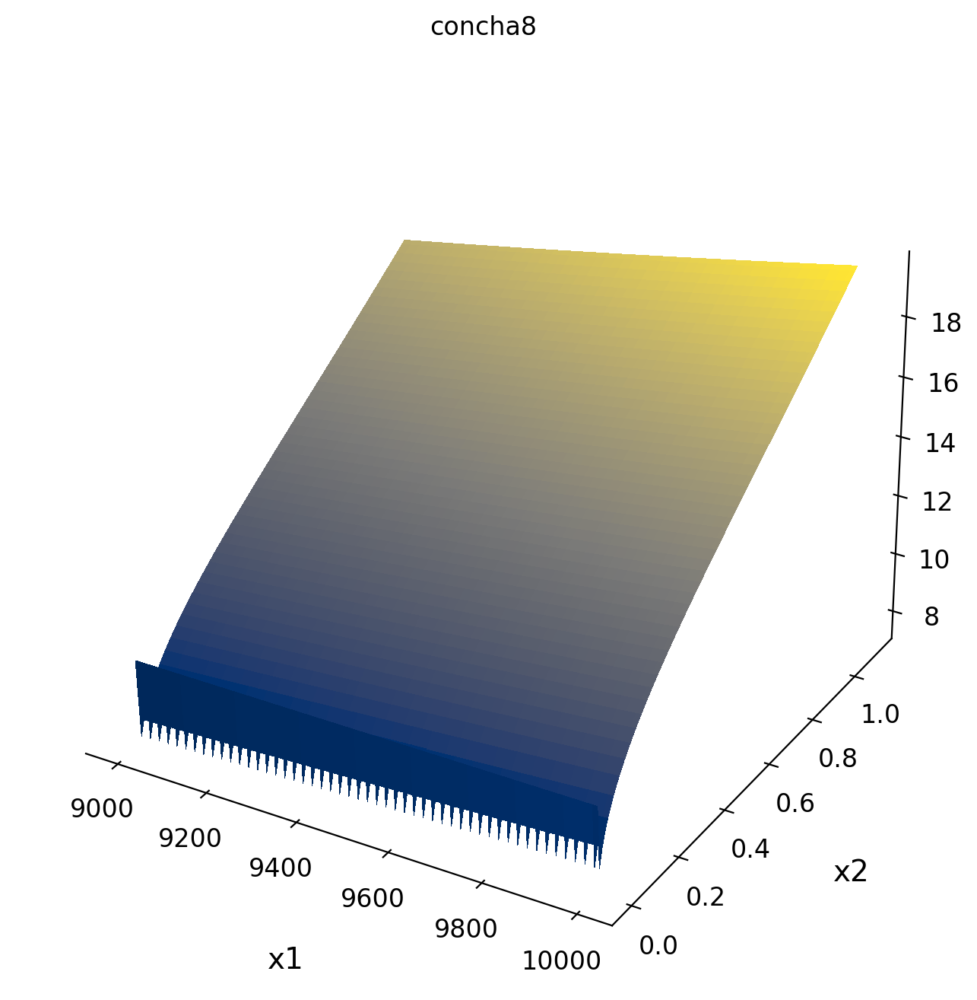

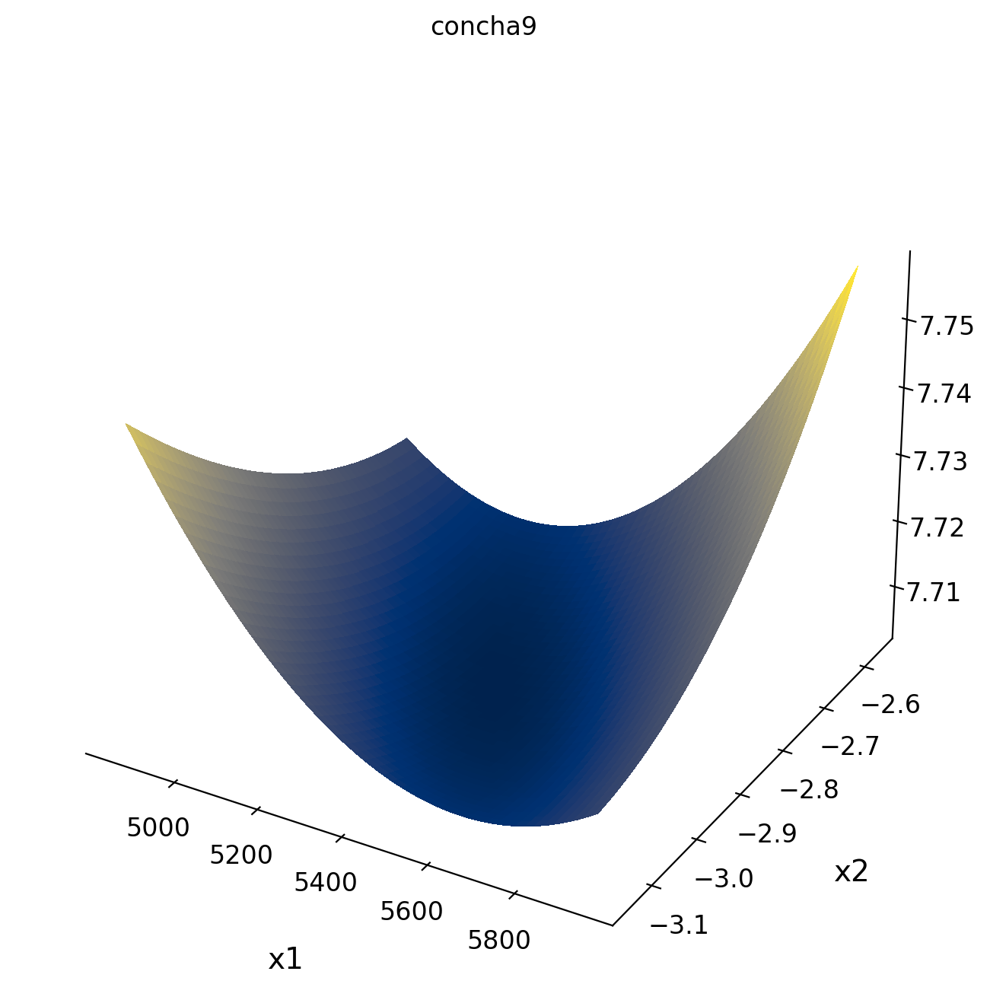

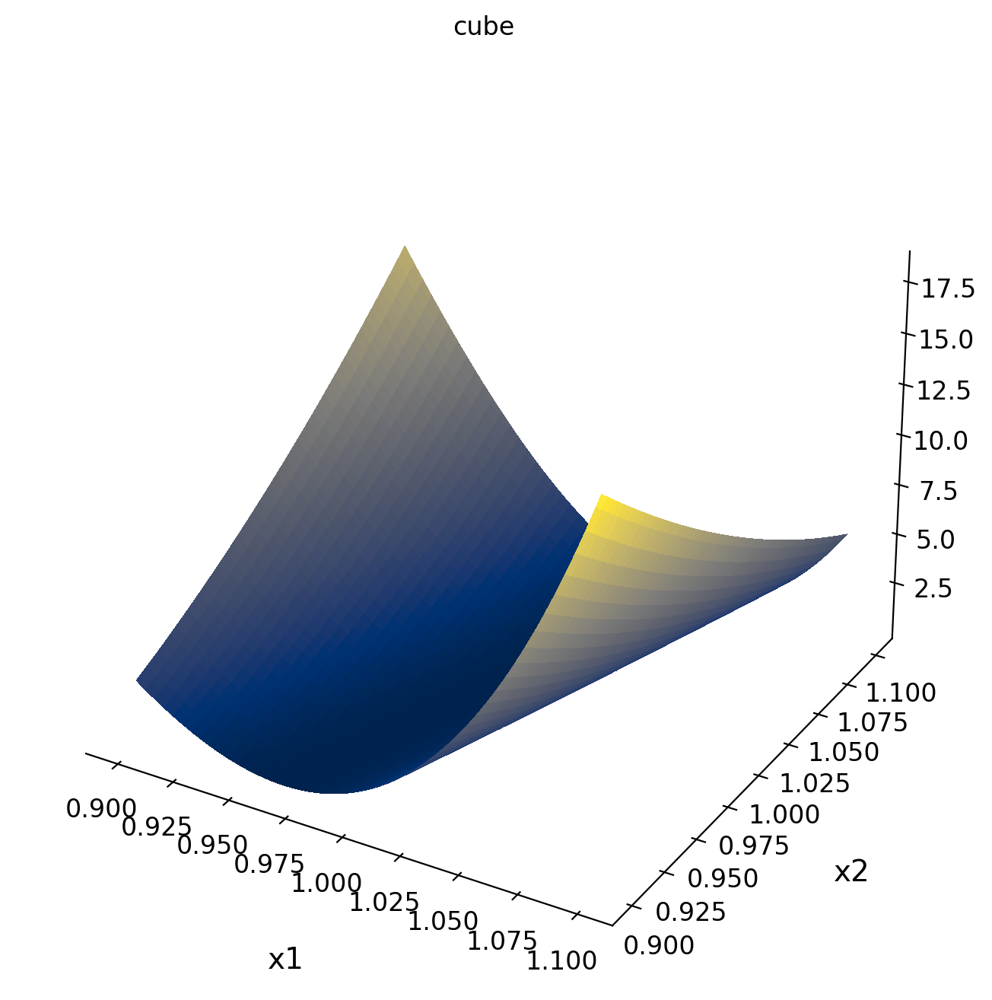

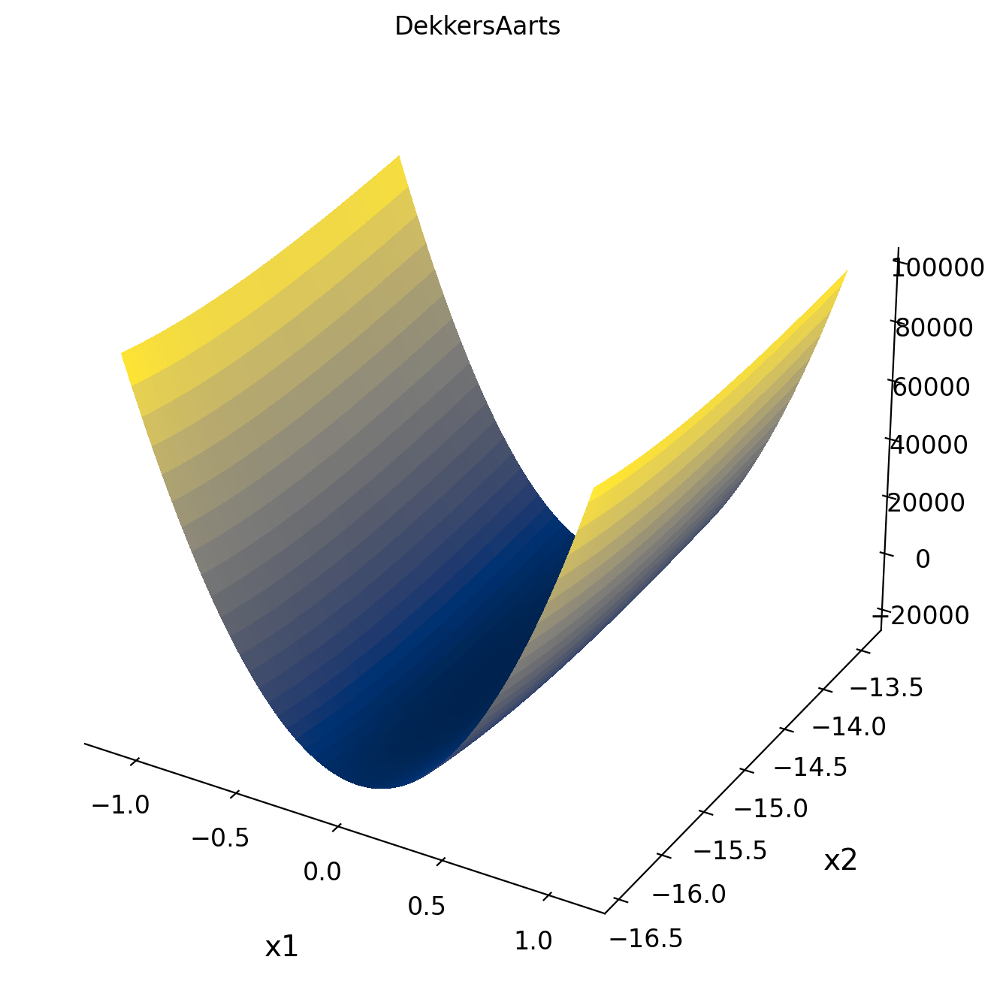

...

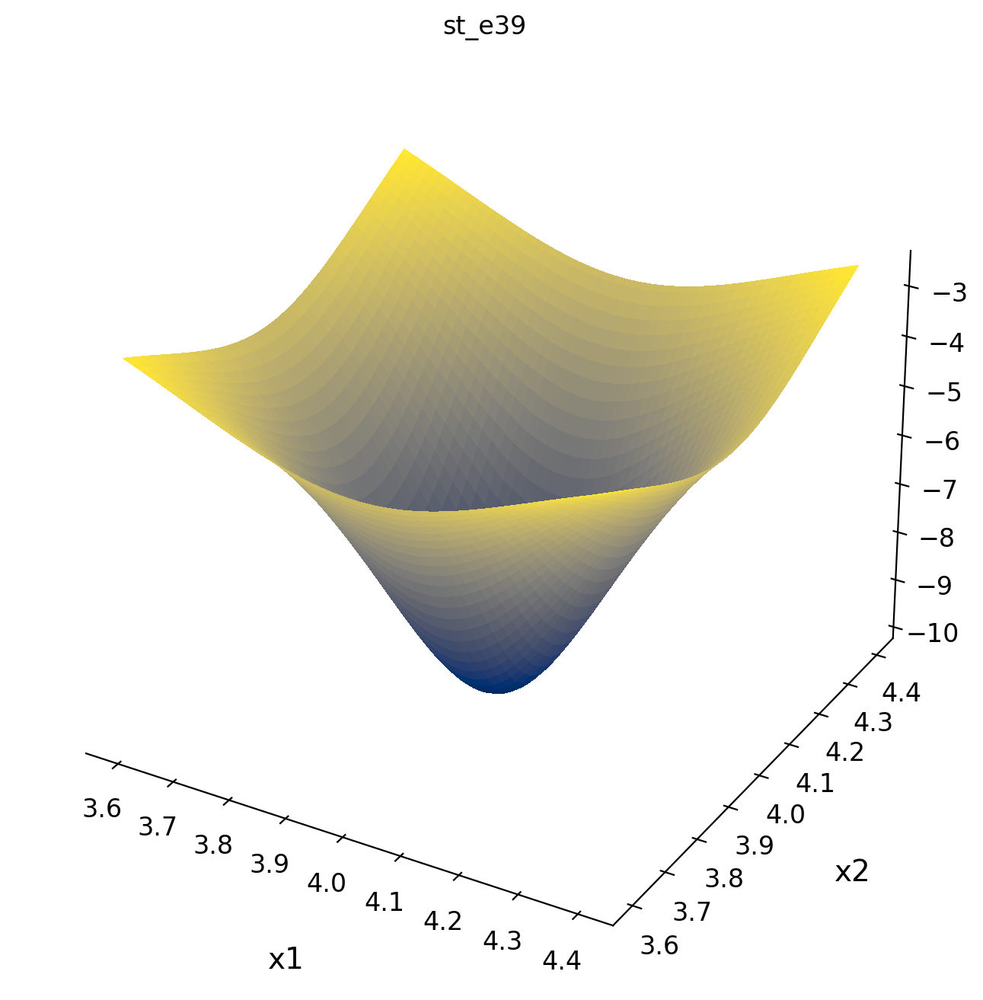

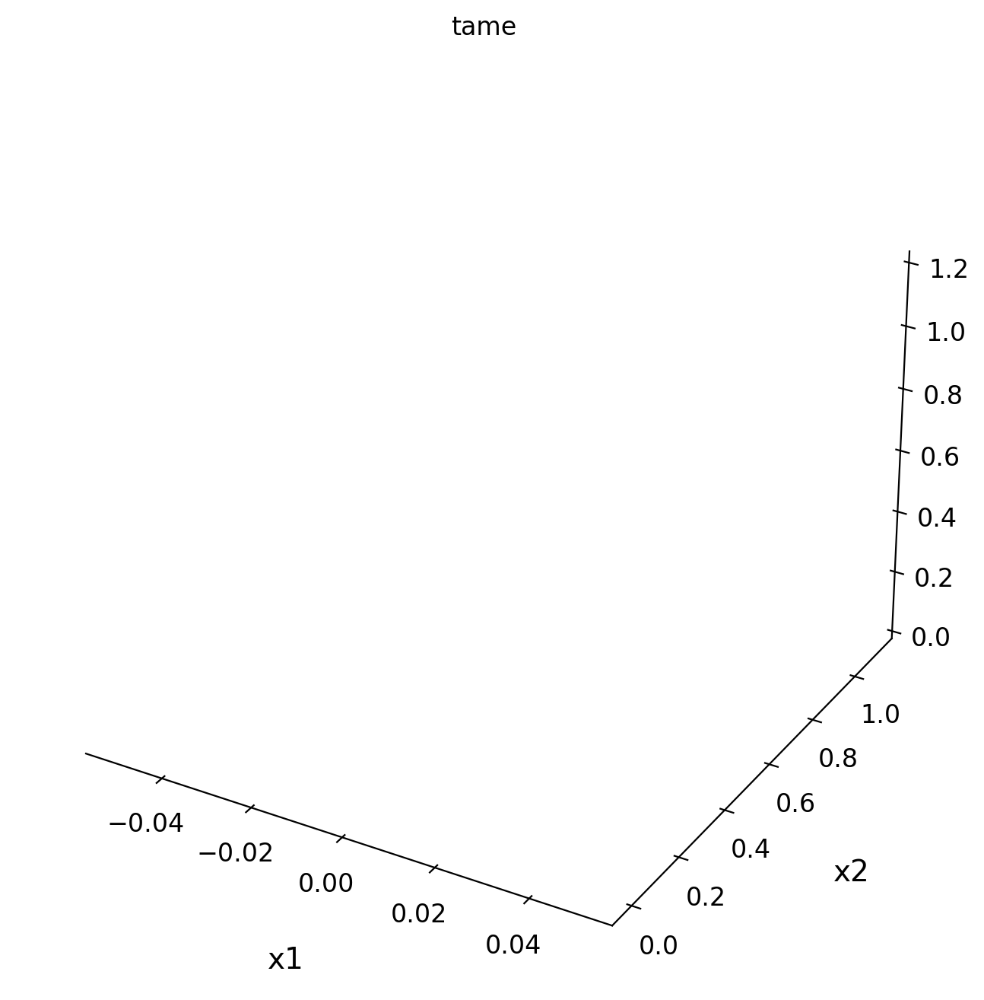

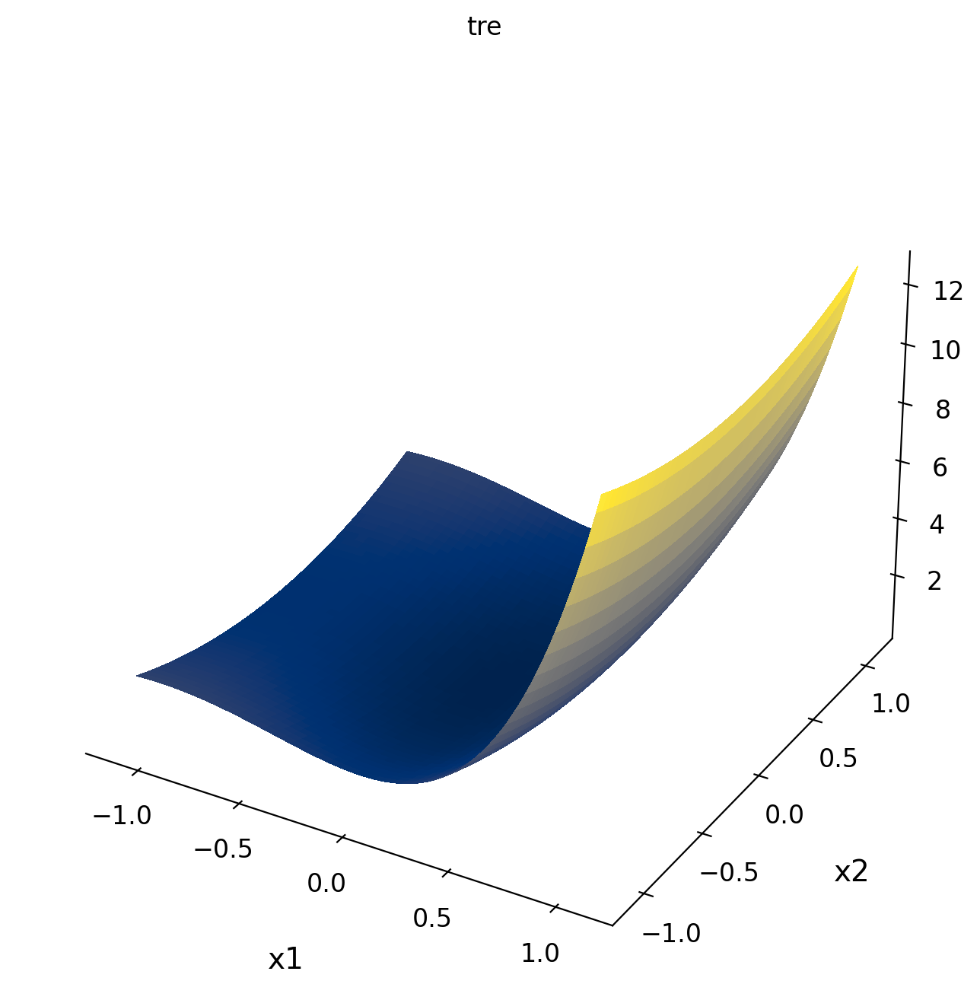

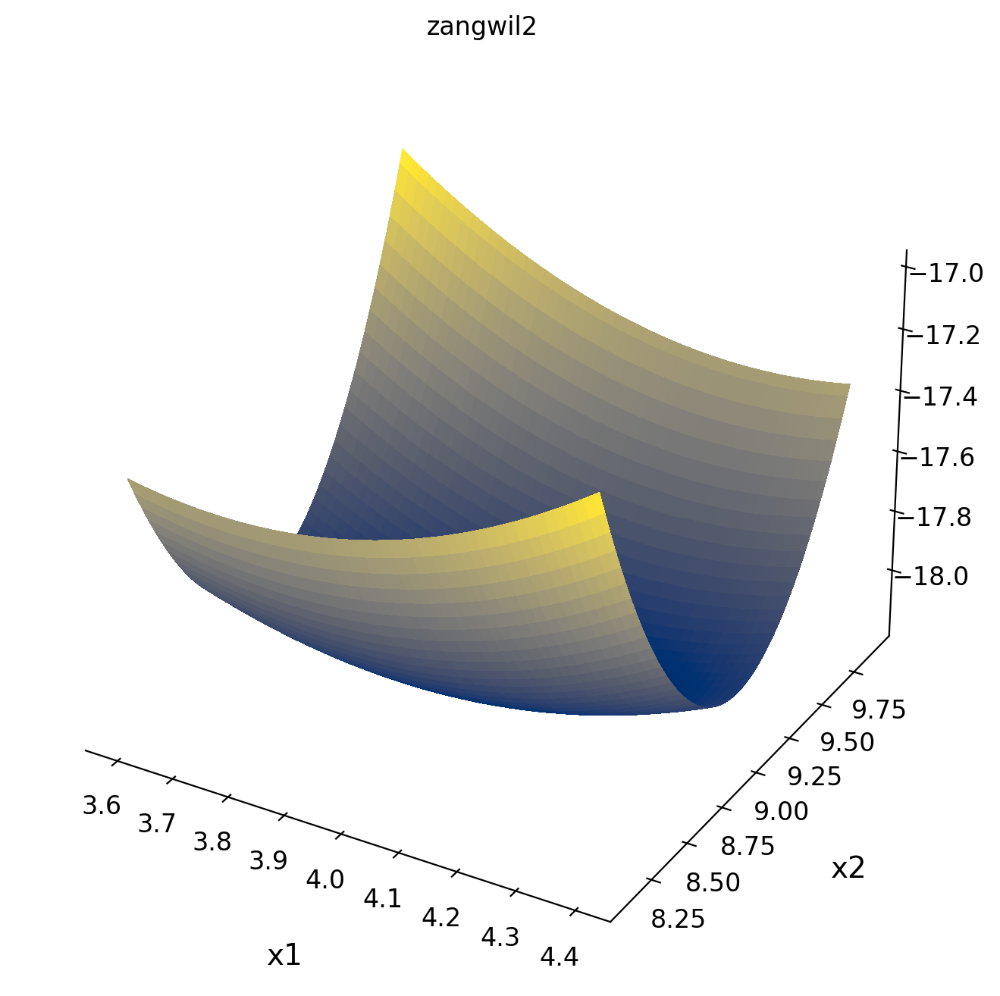

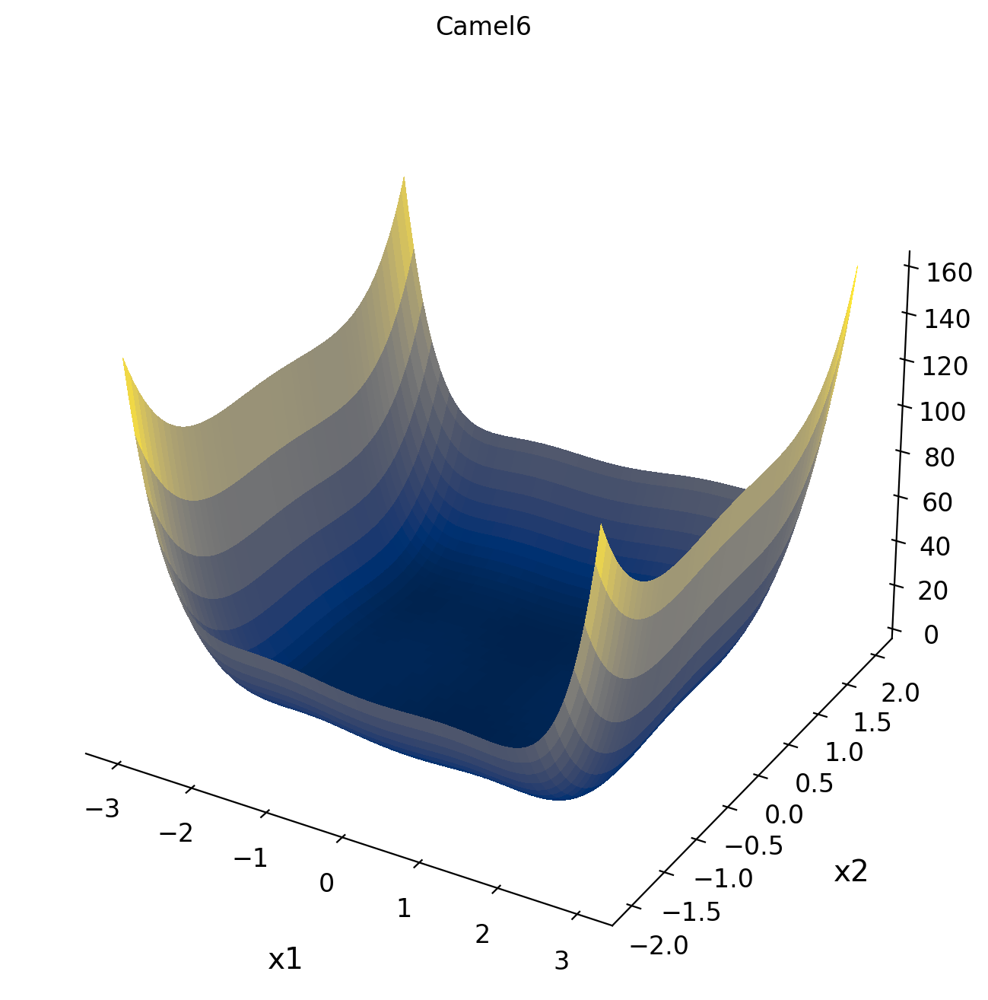

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

fdpi = 200
# bcp contains problems as numpy array - really a dictionary
# params of bcp dictionary
# yopt - optimal value
# xopt - optimal solution
# xlb - lower bound
# xub - upper bound
# n - dimensionality
# func - function to be evaluated - exists as string version of argument where x[:,0] is first variable and x[:,1] is second variable
names = list(bcp.keys())


for i in names:
    # n defines dimensionality - ensures we are only plotting 2D problems
    if bcp[i]['n'] == 2:
        prob = bcp[i]
        xlb = prob['xlb']
        xub = prob['xub']
        # pass problem to benchmark class to enable evaluation
        prbf = benchmark(prob['func'],0)
        bounds = np.array([xlb, xub])
        x = np.linspace(bounds[0,0],bounds[1,0],100)
        y = np.linspace(bounds[0,1],bounds[1,1],100)

        X,Y = np.meshgrid(x,y)
        f = prob['func'].replace("x[:,0]", "X").replace("x[:,1]", "Y")
        Z = eval(f)

        fig = plt.figure(figsize=(8,8), dpi = fdpi)
        ax = fig.add_subplot(111, projection='3d')
        # plt.tight_layout(rect=(4, 1,1, 1)) 
        # Plot a 3D surface
        ax.plot_surface(X, Y, Z, cmap="cividis", antialiased=False)
        ax.set_xlabel('x1',labelpad= 20, fontsize=14)
        ax.set_ylabel('x2',labelpad= 20, fontsize=14)
        ax.set_zlabel('f(x1,x2)',labelpad= 20, fontsize=14)
        ax.set_title(i)
        ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
        ax.xaxis.set_tick_params(labelsize=12)
        ax.yaxis.set_tick_params(labelsize=12)
        ax.zaxis.set_tick_params(labelsize=12)
        ax.grid(False)
        plt.show()

In [2]:
import numpy as np
from gradient_free_optimizers import RandomSearchOptimizer
from sympy.parsing.sympy_parser import parse_expr
from IPython.display import clear_output

# example 2 dim problem to validate optimizer
test_fxn = bcp['BeckerLago']
fxn_form = test_fxn['func'].replace("x[:,0]", "X").replace("x[:,1]", "Y")
xlb = test_fxn['xlb']
xub = test_fxn['xub']

x = np.linspace(xlb[0],xub[0],100)
y = np.linspace(xlb[1],xub[1],100)

# Search space must be passed as a dictionary
search_space = {'X':x, 'Y':y}

def parent_fxn(search_space):
    #clear_output(wait=True)
    X, Y = search_space['X'], search_space['Y']
    # Note, the optimizers maximize the "objective" function, so we need to negate the function to find a minimum
    return -1*eval(fxn_form)

opt = RandomSearchOptimizer(search_space) # initialize optimizer
opt.search(parent_fxn, n_iter=1000) # run optimizer

n_init_search:  10

Results: 'parent_fxn'  
   Best score: -0.00025507601265178475  
   Best parameter:
      'X' : 4.984848484848484  
      'Y' : 4.994949494949495  
 
   Random seed: 1335223462  
 
   Evaluation time   : 0.12128186225891113 sec    [75.75 %]
   Optimization time : 0.03882861137390137 sec    [24.25 %]
   Iteration time    : 0.1601104736328125 sec    [6245.69 iter/sec]
 


In [3]:
from gradient_free_optimizers import HillClimbingOptimizer

# pass initial guess as a dictionary to warm start optimizer
initial_guess = {'X':5.5, 'Y':5.5}
initialize={"warm_start":[initial_guess]}

opt = HillClimbingOptimizer(search_space, epsilon=0.1,initialize={"warm_start":[initial_guess]})
opt.search(parent_fxn, n_iter=100)
opt.search_data.to_csv('./search_data.txt')

n_init_search:  1

Results: 'parent_fxn'  
   Best score: -5.1015202530356945e-05  
   Best parameter:
      'X' : 5.005050505050505  
      'Y' : 4.994949494949495  
 
   Random seed: 210252549  
 
   Evaluation time   : 0.028039932250976562 sec    [36.16 %]
   Optimization time : 0.04949498176574707 sec    [63.84 %]
   Iteration time    : 0.07753491401672363 sec    [1289.74 iter/sec]
 


In [13]:
test_fxn = bcp['BeckerLago']
fxn_form = test_fxn['func']
xlb = test_fxn['xlb']
xub = test_fxn['xub']
print(test_fxn)
print(fxn_form)
print(xlb)
print(xub)

{'yopt': 0.0, 'xopt': array([5., 5.]), 'xub': array([5.5, 5.5]), 'xlb': array([4.5, 4.5]), 'n': 2, 'func': '(-5 + np.sqrt(x[:,0]**2))*(-5 + np.sqrt(x[:,0]**2)) + (-5 + np.sqrt(x[:,1]**2))*(-5 + np.sqrt(x[:,1]**2))'}
(-5 + np.sqrt(x[:,0]**2))*(-5 + np.sqrt(x[:,0]**2)) + (-5 + np.sqrt(x[:,1]**2))*(-5 + np.sqrt(x[:,1]**2))
[4.5 4.5]
[5.5 5.5]


In [42]:
# Higher dimensional problems
names = list(bcp.keys())
for i in names:
    # n defines dimensionality - ensures we are only plotting 2D problems
    if bcp[i]['n'] > 2:
        print(i,'\t',bcp[i]['n'])

3pk 	 30
aircrftb 	 8
arglinb 	 10
arglinc 	 8
biggs3 	 6
biggs5 	 6
biggs6 	 6
biggsb1 	 1000
box3 	 3
brownal 	 10
brownden 	 4
chnrosnb 	 50
concha5 	 3
concha5a 	 3
denschnd 	 3
denschne 	 3
dixon3dq 	 10
draperg 	 3
draperj 	 3
eigena 	 110
eigenals 	 110
eigenb 	 110
eigenbls 	 110
engval2 	 3
errinros 	 50
explin 	 120
explin2 	 120
Expo 	 10
expquad 	 120
extrosnb 	 10
fermat2_vareps 	 3
fermat_vareps 	 3
fletchcr 	 100
genrose 	 500
gridneta 	 72
harkerp2 	 100
hart6 	 6
Hartman3 	 3
hatflda 	 4
hatfldb 	 4
hatfldc 	 4
hatfldd 	 3
hatflde 	 3
heart8ls 	 8
hilberta 	 10
hilbertb 	 50
hs038 	 4
hs045 	 5
hs110 	 10
kowalik 	 4
MeyerRoth 	 3
model13 	 6
model14 	 6
model15 	 6
model16 	 4
model18 	 5
model23 	 3
model24 	 3
model3 	 3
model31 	 3
model32 	 3
model33 	 3
model4 	 3
model42 	 3
model45 	 3
model5 	 3
Neumaier2 	 4
Neumaier3 	 10
obstclal 	 96
obstclbl 	 96
obstclbu 	 96
osborne1 	 5
osbornea 	 5
oslbqp 	 8
palmer1c 	 8
palmer1d 	 7
palmer2c 	 8
palmer3c 	 8
palmer4

In [23]:
test_fxn = bcp['3pk']
fxn_form = test_fxn['func']
xlb = test_fxn['xlb']
xub = test_fxn['xub']
print(test_fxn)
print(fxn_form)
print(xlb)
print(xub)

{'yopt': 1.7201185696472931, 'xopt': array([  0.33985656,   0.42117012,   0.59288243,   0.57954962,
         0.57793263,   0.43969402,   0.33643372,   0.71901487,
         0.49244644,   0.46523103,   0.3874663 ,   0.31202522,
         0.37342037,   0.43042357,   0.43014276,  64.98987043,
        78.44856887,  93.22713464,  19.56363611,  19.49927639,
       103.59587108, 113.59397421,  19.69259936, 281.46306309,
        39.74256111,  37.34322247,  25.8536101 ,  67.0214678 ,
        70.40776254,  19.74633363]), 'xub': array([  1.1       ,   1.1       ,   1.1       ,   1.1       ,
         1.1       ,   1.1       ,   1.1       ,   1.1       ,
         1.1       ,   1.1       ,   1.1       ,   1.1       ,
         1.1       ,   1.1       ,   1.1       ,  71.48885747,
        86.29342576, 102.54984811,  21.51999972,  21.44920402,
       113.95545818, 124.95337163,  21.66185929, 309.60936939,
        43.71681723,  41.07754472,  28.43897111,  73.72361458,
        77.44853879,  21.72096699]), 

In [24]:
# systematically setup search space as dictionary - this is basically dictionary comprehension
#creates a dictionary with keys i and values np.linspace(xlb[i],xub[i],100) for i in range(30)
search_space = {str(i):np.linspace(xlb[i],xub[i],100) for i in range(30)}

In [25]:
from gradient_free_optimizers import RandomSearchOptimizer
from IPython.display import clear_output

# create looped funtion to do replacement in string version of functions
def multiple_replace(_string:str, find_replace:list):
    new_string = _string
    for find,replace in find_replace:
        new_string = new_string.replace(find,replace)
    return new_string

# Create find and replace pairs as tuples using list comprehension - do in reverse order to avoid replacing only part of a number
find_rep_list = [('x[:,{}]'.format(29-i),'x["{}"]'.format(29-i)) for i in range(30)]
opt_form = multiple_replace(fxn_form, find_rep_list)

# Create a container for objective function - need to use eval to evaluate string version of function, but can't pass that
#directly to optimizer
def parent_fxn(search_space):
    #clear_output(wait=True)
    x = search_space
    return -1*eval(opt_form)

initial_guess = {str(i):90 for i in range(30)}
#opt = RandomSearchOptimizer(search_space) # initialize optimizer
opt = HillClimbingOptimizer(search_space, epsilon=0.1,initialize={"warm_start":[initial_guess]})
opt.search(parent_fxn, n_iter=100)
#opt.search(parent_fxn, n_iter=1000000) # run optimizer








  0%|          | 0/100 [00:00<?, ?it/s, best_iter=0, best_pos=[99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 32 99 99  0  0 99  0



  1%|          | 1/100 [00:00<00:01, 62.48it/s, best_iter=1, best_pos=[ 8 97 98 82 48 16 25 20 27 33 57 88 17 24 16 77 58 65 38 49 62 19 99 28



  2%|▏         | 2/100 [00:00<00:01, 86.96it/s, best_iter=2, best_pos=[22 44 37 32 98 66 46 50 16 24 65 23 36 10 73 68 85 47 95 93 58 56 49 53



 17%|█▋        | 17/100 [00:00<00:00, 234.35it/s, best_iter=17, best_pos=[24 16 84 44 27 15 90 57 22 53 79 63 14 12 61 93 37 31  0 83 20  2 14  1



 21%|██        | 21/100 [00:00<00:00, 248.42it/s, best_iter=21, best_pos=[ 3 62 45  4 45 59 14 66 98 46 38 66 50 37 83 97 22 18 26 32 30 55 38 19



 28%|██▊       | 28/100 [00:00<00:00, 278.52it/s, best_iter=21, best_pos=[ 3 62 45  4 45 59 14 66 98 46 38 66 50 37 83 97 22 18 26 32 30 55 38 19



 28%|██▊       | 28/100 [00:00<00:00, 278.52it/s, best_iter=28, best_pos=[11 71 45  3 58 63 12 51 91 47 39 65 39 36 


Results: 'parent_fxn'  
   Best score: -458.38866004023845  
   Best parameter:
      '0'  : 0.37777777777777777  
      '1'  : 0.6222222222222222  
      '2'  : 0.7333333333333334  
      '3'  : 0.1  
      '4'  : 0.6111111111111112  
      '5'  : 0.8555555555555556  
      '6'  : 0.13333333333333333  
      '7'  : 0.5555555555555556  
      '8'  : 1.1  
      '9'  : 0.37777777777777777  
      '10' : 0.3888888888888889  
      '11' : 0.7333333333333334  
      '12' : 0.5  
      '13' : 0.35555555555555557  
      '14' : 0.8  
      '15' : 70.83239413238051  
      '16' : 73.2979052586313  
      '17' : 88.23618703013646  
      '18' : 18.911514902756664  
      '19' : 18.534160685231413  
      '20' : 103.28194419494848  
      '21' : 112.33181893704445  
      '22' : 18.877047260883433  
      '23' : 262.98316500459595  
      '24' : 43.47595321963303  
      '25' : 37.15462033850202  
      '26' : 27.446610320618387  
      '27' : 67.63075387413818  
      '28' : 72.32797424501999

In [36]:
from gradient_free_optimizers import DirectAlgorithm

opt = DirectAlgorithm(search_space)
opt.search(parent_fxn, n_iter=10000)


Results: 'parent_fxn'  
   Best score: -15.912166966465017  
   Best parameter:
      '0'  : 0.43333333333333335  
      '1'  : 0.5555555555555556  
      '2'  : 1.1  
      '3'  : 0.2888888888888889  
      '4'  : 0.5777777777777778  
      '5'  : 0.8555555555555556  
      '6'  : 0.2555555555555556  
      '7'  : 0.3666666666666667  
      '8'  : 1.1  
      '9'  : 0.41111111111111115  
      '10' : 0.6444444444444445  
      '11' : 0.5555555555555556  
      '12' : 0.07777777777777778  
      '13' : 0.5111111111111112  
      '14' : 0.03333333333333333  
      '15' : 61.510614737757685  
      '16' : 70.60371198425999  
      '17' : 83.90442117807  
      '18' : 18.832469908387775  
      '19' : 18.02205847713788  
      '20' : 98.04982949408989  
      '21' : 102.69354233774747  
      '22' : 18.2007357678697  
      '23' : 290.84516518886664  
      '24' : 37.29377704620414  
      '25' : 34.5141904667303  
      '26' : 24.051691822349696  
      '27' : 63.43344982989737  
      

In [39]:
from gradient_free_optimizers import RandomRestartHillClimbingOptimizer

opt = RandomRestartHillClimbingOptimizer(search_space, n_iter_restart=200)
opt.search(parent_fxn, n_iter=1000)


Results: 'parent_fxn'  
   Best score: -34.98163155301999  
   Best parameter:
      '0'  : 0.3111111111111111  
      '1'  : 0.2777777777777778  
      '2'  : 0.044444444444444446  
      '3'  : 0.7555555555555555  
      '4'  : 0.6777777777777778  
      '5'  : 0.5222222222222223  
      '6'  : 0.5444444444444445  
      '7'  : 0.6444444444444445  
      '8'  : 0.4777777777777778  
      '9'  : 0.23333333333333334  
      '10' : 0.6444444444444445  
      '11' : 0.05555555555555556  
      '12' : 0.8222222222222223  
      '13' : 0.33333333333333337  
      '14' : 1.0222222222222224  
      '15' : 60.85415140010819  
      '16' : 80.42959333784948  
      '17' : 89.5545505503306  
      '18' : 19.22769488023222  
      '19' : 20.149252264603334  
      '20' : 102.4448058428111  
      '21' : 114.62664669878181  
      '22' : 20.030755101906866  
      '23' : 272.6495732317919  
      '24' : 40.344721131792426  
      '25' : 38.43711484764828  
      '26' : 24.312839399139595  
     

In [44]:
test_fxn = bcp['arglinb']
fxn_form = test_fxn['func']
xlb = test_fxn['xlb']
xub = test_fxn['xub']
print(test_fxn)
print(fxn_form)
print(xlb)
print(xub)

search_space = {str(i):np.linspace(xlb[i],xub[i],100) for i in range(10)}

{'yopt': 1.1479681652956555e+80, 'xopt': array([ 7.50000030e+49,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -1.50000006e+49,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00]), 'xub': array([ 1.00000000e+10,  1.10000000e+00,  1.10000000e+00,  1.10000000e+00,
       -1.35000005e+49,  1.10000000e+00,  1.10000000e+00,  1.10000000e+00,
        1.10000000e+00,  1.10000000e+00]), 'xlb': array([ 6.75000027e+49, -1.10000000e+00, -1.10000000e+00, -1.10000000e+00,
       -9.99999999e+08, -1.10000000e+00, -1.10000000e+00, -1.10000000e+00,
       -1.10000000e+00, -1.10000000e+00]), 'n': 10, 'func': '(-1 + x[:,0] + 2*x[:,1] + 3*x[:,2] + 4*x[:,3] + 5*x[:,4] + 6*x[:,5] + 7*x[:,6] + 8*x[:,7] + 9*x[:,8] + 10*x[:,9])**2+ (-1 + 2*x[:,0] + 4*x[:,1] + 6*x[:,2] + 8*x[:,3] + 10*x[:,4] + 12*x[:,5] + 14*x[:,6] + 16*x[:,7] + 18*x[:,8] + 20*x[:,9])**2 + (-1 + 3*x[:,0] + 6*x[:,1] + 9*x[:,2] + 12*x[:,3] + 15*x[:,4] + 18*x[:,5] + 21*x[:,6] + 24*x[:,7] +27*x[:

In [46]:
find_rep_list = [('x[:,{}]'.format(9-i),'x["{}"]'.format(9-i)) for i in range(10)]
opt_form = multiple_replace(fxn_form, find_rep_list)

# Create a container for objective function - need to use eval to evaluate string version of function, but can't pass that
#directly to optimizer
def parent_fxn(search_space):
    clear_output(wait=True)
    x = search_space
    return -1*eval(opt_form)

opt = RandomSearchOptimizer(search_space) # initialize optimizer
opt.search(parent_fxn, n_iter=100000) # run optimizer


Results: 'parent_fxn'  
   Best score: -7.17499995734589e+22  
   Best parameter:
      '0' : 9999999999.0  
      '1' : 0.033333333333333215  
      '2' : -0.34444444444444455  
      '3' : -0.5222222222222223  
      '4' : -999999999.0  
      '5' : 0.5666666666666667  
      '6' : 0.07777777777777772  
      '7' : -0.4111111111111112  
      '8' : -0.7222222222222223  
      '9' : -0.9888888888888889  
 
   Random seed: 921266009  
 
   Evaluation time   : 122.38953995704651 sec    [96.11 %]
   Optimization time : 4.957053899765015 sec    [3.89 %]
   Iteration time    : 127.34659385681152 sec    [785.26 iter/sec]
 


In [47]:
from gradient_free_optimizers import DirectAlgorithm

opt = DirectAlgorithm(search_space)
opt.search(parent_fxn, n_iter=10000)


Results: 'parent_fxn'  
   Best score: -9.299233499482769e+79  
   Best parameter:
      '0' : 6.750000268218e+49  
      '1' : -1.1  
      '2' : -1.1  
      '3' : -1.1  
      '4' : -1.35000005364e+49  
      '5' : 1.1  
      '6' : 1.1  
      '7' : -1.1  
      '8' : 1.1  
      '9' : -1.1  
 
   Random seed: 1617688495  
 
   Evaluation time   : 7.077274560928345 sec    [51.78 %]
   Optimization time : 6.591235399246216 sec    [48.22 %]
   Iteration time    : 13.66850996017456 sec    [731.61 iter/sec]
 
